<a href="https://colab.research.google.com/github/guiraposo/PINNs_Core/blob/main/Simple_Examples/PINNs_Core.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## In this notebook we will see:
1. How to use PINNs to solve differential equations, including ODEs, PDEs and eigenvalue problems.<br>Original paper:<br>

 - Maziar Raissi, Paris Perdikaris, George Em Karniadakis, <i>Physics-informed neural networks: A deep learning framework for solving forward and inverse problems involving nonlinear partial differential equations</i>, Journal of Computational Physics, 378, 686-707, 2019. https://arxiv.org/abs/1711.10561

We will apply it to the study different types of differential equations. Notebook based on the strong gravity lectures of Raimon Luna (cf.  [MachineLearningForStrongGravity](https://github.com/raimonluna/) )

In [1]:
import numpy as np
import sympy as sp

#Torch libraries
import torch
import torch.nn as nn
import torch.optim as optim

#Plots and Graphic libraries
import matplotlib.pyplot as plt
from IPython import display
import matplotlib.gridspec as gridspec
from matplotlib import animation
from IPython.display import HTML

In [2]:
def gradients(outputs, inputs, order = 1):
    if order == 1:
        return torch.autograd.grad(outputs, inputs, grad_outputs=torch.ones_like(outputs), create_graph=True)[0]
    elif order > 1:
        return gradients(gradients(outputs, inputs, 1), inputs, order - 1)
    else:
        return outputs

# Example 1: System of Coupled Ordinary Differential Equations (ODEs)

Here we solve the system of ODEs for the sine and cosine functions.

$$s'(x) = c(x),$$
$$c'(x) = -s(x),$$

As expected the solutions are of the form $c(x)=A\cos(x + \psi)$ and $s(x)=A\sin(x + \psi)$.

Let us set the initial conditions as in order to fix the phase and amplitude.

$$s(0) = 0, \;c(0) = 1.$$
<br>


In [ ]:
class ODE(nn.Module):
    def __init__(self):
        super(ODE, self).__init__()

        # Let's apply a simple ANN with 1 hidden layer. Use GELU activation function
        self.net = nn.Sequential(
            nn.Linear(1, 40), # 1 input -> independent variable x
            nn.GELU(),
            nn.Linear(40, 40),  # hidden layer
            nn.GELU(),
            nn.Linear(40, 2), # 2 outputs -> function c(x) and s(x)
        )

        # Initialization of weights and bias
        for layer in self.net.modules():
            if isinstance(layer, nn.Linear):
                nn.init.normal_(layer.weight, mean = 0, std = 0.1)
                nn.init.constant_(layer.bias, val = 0.0) # standard initialization

    def forward(self, x):
        return self.net(x)

# Define class to compute the ODE loss.
class ODELoss(nn.Module):
    def __init__(self, ode):
        super(ODELoss, self).__init__()
        self.ode = ode

    def forward(self, x):

        f  = self.ode(x)  # Get the approximate solutions

        # Get the approximate solutions for c(x) and s(x)
        c, s = map(lambda i:  f[:,[i]], range(2))

        # Compute the gradients
        dcdx = gradients(c, x)  # c'(x)
        dsdx = gradients(s, x)  # s'(x)

        # Differential Equation Loss:
        # Should be 0 for a solution of the eqs.
        eq_loss = torch.mean((dcdx + s)**2 + (dsdx - c)**2)

        # Initial Condition Loss:
        # We impose the boundary conditions on the equations.
        zero_vals = self.ode(torch.zeros(1,1))
        ic_loss = (zero_vals[0,0] - 1)**2 + zero_vals[0,1]**2

        return eq_loss, ic_loss


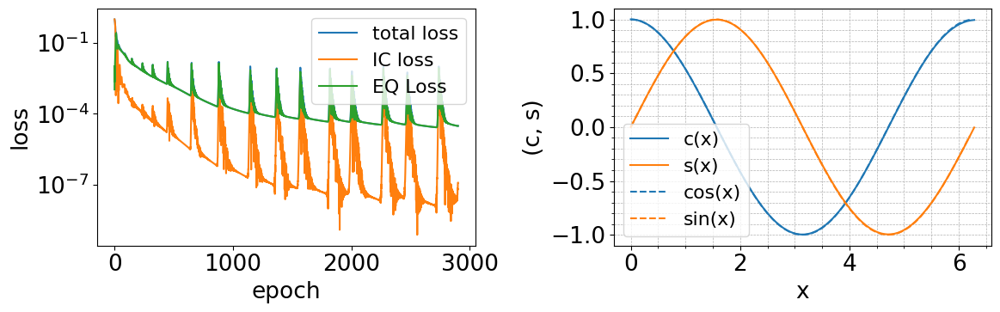

In [ ]:
ode = ODE()  # Initializes the NN class.
odeloss = ODELoss(ode)  # Intitalizes the loss class.


optimizer = optim.Adam(ode.parameters(), lr=1e-2)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=(0.1)**(1/2000))

x = torch.tensor(np.linspace(0, 2 * np.pi, 100, dtype = np.float32)).reshape(100, 1)
x.requires_grad = True

x_range = np.arange(0, 2*np.pi, 0.1)
c_true = np.cos(x_range)
s_true = np.sin(x_range)




################## Training and Plotting ##################

# Array for saving the loss values
loss_hist = []  # Total loss
ic_loss_hist = []  # Boundary condition loss
eq_loss_hist = []  # ODE loss

fig, (ax1, ax2) = plt.subplots(1,2, figsize = (12, 4));
font = {'size'   : 19}
plt.rc('font', **font)

for epoch in range(3000):
    try:
        optimizer.zero_grad()

        eq_loss, ic_loss = odeloss(x)
        loss = eq_loss + ic_loss
        loss.backward()
        optimizer.step()

        #scheduler.step()
        loss_hist.append(loss.item())
        ic_loss_hist.append(ic_loss.item())
        eq_loss_hist.append(eq_loss.item())

        if epoch % 100 == 0:

            # Visualization for the Loss
            ax1.cla()
            ax1.set_xlabel('epoch')
            ax1.set_ylabel('loss')
            ax1.set_yscale('log')
            ax1.plot(loss_hist)
            ax1.plot(ic_loss_hist)
            ax1.plot(eq_loss_hist)
            ax1.legend(["total loss","IC loss", "EQ Loss"], fontsize='small')

            # Visualization for the solutions
            ax2.cla()
            ax2.set_xlabel('x')
            ax2.set_ylabel('(c, s)')
            ax2.plot(x.cpu().detach().numpy(), ode(x)[:, 0].cpu().detach().numpy())
            ax2.plot(x.cpu().detach().numpy(), ode(x)[:, 1].cpu().detach().numpy())
            ax2.plot(x_range, c_true, color='#1f77b4', linestyle = '--') #Plot for the exact solution of cosine
            ax2.plot(x_range, s_true, color = '#ff7f0e', linestyle = '--') #Plot for the exact solution of sine

            ax2.legend(["c(x)","s(x)", "cos(x)", "sin(x)"], fontsize='small')
            plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5)

            plt.minorticks_on()


            display.display(plt.gcf())
            display.clear_output(wait=True)
            plt.tight_layout()

    except KeyboardInterrupt:
        break


As expected the output of the neural network for $c(x)$ and $s(x)$ represent the cosine and the sine.

 The loss function decreases and is low, validating also the method. Just by looking at the plot on the right one can see that the solutions of the PINN (solid lines) approximate very well the exact solutions (dashed lines).

 Let us now repeat the exercise but impose the boundary conditions using strong-enforcement. (TBD)


# Simple Eigenvalue Problem: Vibrating String

Let us consider the case of a oscillating string. The equation that governs waves on strings is given by (we set $c=1$ for simplicity):

$$-\frac{\partial^2 \Psi(t,x)}{\partial t^2} +\frac{\partial^2 \Psi(t,x)}{\partial x^2}=0 $$.

Instead of solving the full partial differential equation (PDE), it is often useful to look at the frequency-domain by taking the fourier decomposition of the function.

$$ $$

By doing this transformation our single PDE reduces to a system of infinite (but separable) ordinary differential equations (ODEs).

$$\psi''(x) + \lambda^2 \psi(x) = 0$$

One option is to provide a value of $\lambda$ and solve the equation. Another option is to impose boundary conditions and reduce this equation to an eigenvalue problem.


Here we want to apply NNs to solve the eigenvalue problem


$$\psi''(x) + \lambda^2 \psi(x) = 0, \quad {\rm with} \quad \psi(0) = \psi(1) = 0.$$

Let us start by checking what we expect the solution to be:
<br>

In [ ]:
psi = sp.Function('psi')
x = sp.symbols('x')
lam = sp.symbols('lam')

In [ ]:
diff_eq1 = sp.Eq(psi(x).diff(x).diff(x) , - lam ** 2 * psi(x))

solution = sp.dsolve(diff_eq1, psi(x))
print(solution)



Eq(psi(x), C1*exp(-I*lam*x) + C2*exp(I*lam*x))


In [ ]:
C1, C2 = sp.symbols('C1 C2')
general_solution = solution.rhs  # Get the right-hand side of the solution


In [ ]:
# Apply the first boundary condition f(0) = 0
bc1 = general_solution.subs(x, 0).subs(psi(0), 0)
solutions = sp.solve((bc1), (C2), dict=True)
print(solutions)
replaced_solution = general_solution.subs(C2,-C1) #This is the solution with the boundary condition at x=0 satisfied
print(replaced_solution)


[{C2: -C1}]
-C1*exp(I*lam*x) + C1*exp(-I*lam*x)


We can easily see the expression at x=1:

In [ ]:
replaced_solution.subs(x,1)

-C1*exp(I*lam) + C1*exp(-I*lam)

It is easy to see that this boundary condition is only satisfied when

$$\lambda = n \times \pi, $$
and $n$ is an integer number.

Our neural network should find sinusoidal solutions with this eigenvalue.

In [ ]:
class ODE(nn.Module):
    def __init__(self):
        super(ODE, self).__init__()

        self.lam = nn.Parameter(torch.tensor(7., requires_grad=True))  # Adjusted for the first overtone

        self.net = nn.Sequential(
            nn.Linear(1, 40),
            nn.GELU(),
            nn.Linear(40, 40),
            nn.GELU(),
            nn.Linear(40, 1),
        ) # 1 hidden layer is enough

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean = 0, std = 0.3)
                nn.init.constant_(m.bias, val = 0)

    def forward(self, x):
        return self.net(x) * x * (1 - x) #This is another way to force the boundary conditions
def node_penalty(f, expected_sign_changes=1):

    # Calculate the sign of f at each point
    sign_f = torch.sign(f)

    # Calculate the difference in sign between consecutive elements
    # A non-zero difference indicates a sign change
    product_consecutive = f[1:] * f[:-1] #If the product of two consecutive numbers is negative, it means that the sign changed. (if the function is oscillating around 0)

    sign_changes =  (product_consecutive < 0).float()



    # Count the number of sign changes (non-zero entries imply a sign change)
    num_sign_changes = torch.sum(sign_changes).float()

    # Calculate the penalty as the squared difference between the observed and expected sign changes
    penalty = (((num_sign_changes - expected_sign_changes) ** 2))/(expected_sign_changes + num_sign_changes+0.001) ** 2

    return penalty, num_sign_changes

def amplitude_regularization(f, target_amplitude):
    # Calculate the deviation of f's peak (or average) amplitude from the target
    amplitude_deviation = torch.abs(torch.max(torch.abs(f)) - target_amplitude)
    return amplitude_deviation**2

class ODELoss(nn.Module):
    def __init__(self, ode):
        super(ODELoss, self).__init__()
        self.ode = ode

    def forward(self, x):
        f  = self.ode(x)
        d2f = gradients(f, x, 2)
        base_loss = torch.mean((d2f + f*self.ode.lam**2)**2)
        #regularization = torch.mean(torch.abs(f) - 1)**2
        regularization = torch.tensor(0)
        # Node penalty encouraging the presence of a node (zero crossing)
        node_penalty_term , num_sign_changes_term = node_penalty(f)
        amplitude_loss = amplitude_regularization(f,1)
        loss = base_loss + 1*regularization  +  node_penalty_term + amplitude_loss
      #  loss = torch.mean((d2f + f*self.ode.lam**2)**2+ (torch.mean(f) )**2)

        return loss, node_penalty_term, num_sign_changes_term, regularization

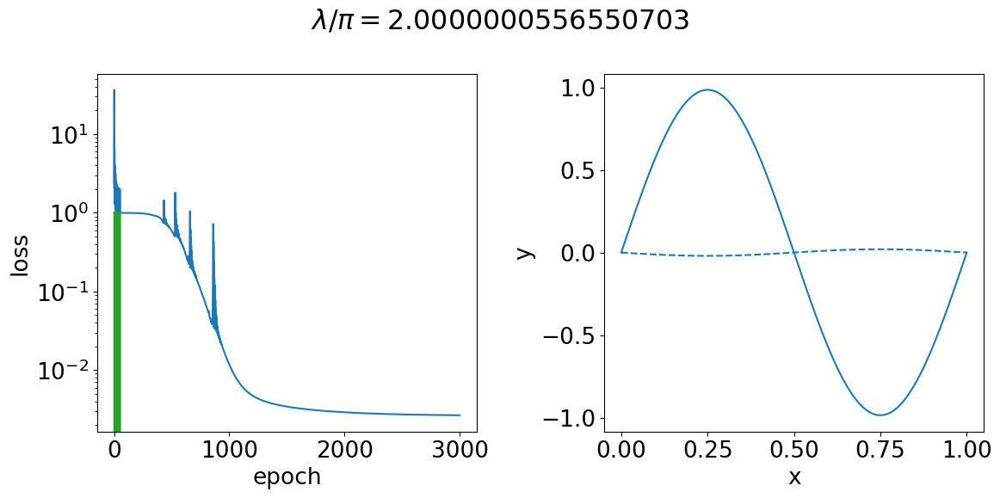

In [ ]:
ode = ODE()
odeloss = ODELoss(ode)
loss_hist = []
regularization_loss_hist = [] #For checking the contribution of the regularization loss.
node_loss_hist = [] # For checking the contribution of the node loss.

optimizer = optim.Adam(ode.parameters(), lr=5e-2)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=(0.01)**(1/2000))
#scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)

x = torch.tensor(np.linspace(0, 1, 500, dtype = np.float32)).reshape(500, 1)
x.requires_grad = True

################## Training and Plotting ##################

fig, (ax1, ax2) = plt.subplots(1,2, figsize = (12, 6));
font = {'size'   : 19}
plt.rc('font', **font)
x_vals = np.linspace(0, 1, 100)
c_vals = -0.02*np.sin(2* np.pi * x_vals)
for epoch in range(3001):
    try:
        optimizer.zero_grad()

        loss, node_penalty_term, num_sign_changes_term, regularization_term = odeloss(x)
        loss.backward()
        optimizer.step()

        scheduler.step()
        loss_hist.append(loss.item())
        regularization_loss_hist.append(regularization_term.item())
        node_loss_hist.append(node_penalty_term.item())

        if epoch % 100 == 0:
            #print(f"Epoch {epoch}, Node Penalty Term: {node_penalty_term.item()}, Sign changes: {num_sign_changes_term.item()}")
            plt.suptitle(f'$\lambda/\pi = {ode.lam.item() / np.pi}$')

            ax1.cla()
            ax1.set_xlabel('epoch')
            ax1.set_ylabel('loss')
            ax1.set_yscale('log')
            ax1.plot(loss_hist)
            ax1.plot(regularization_loss_hist)
            ax1.plot(node_loss_hist)

            ax2.cla()
            ax2.set_xlabel('x')
            ax2.set_ylabel('y')
            ax2.plot(x.cpu().detach().numpy(), ode(x).cpu().detach().numpy())
            ax2.plot(x_vals, c_vals, color='#1f77b4', linestyle = '--') #Plot for the exact solution of cosine

            display.display(plt.gcf())
            display.clear_output(wait=True)
            plt.tight_layout()

    except KeyboardInterrupt:
        break


Finding the fundamental mode is easy.
However the network is having trouble finding higher overtones.

# Example 2: Heat Equation (Parabolic PDE)

In this section we will move to the study of 2-dimensional equations. We can start with the analysis of a parabolic PDE, in particular we focus on the analysis of the heat equation
$$ \partial_t u = \partial^2_{xx} u.$$
While for ODEs (previous case) we only need to specify boundary conditions (BCs)here we also need to specify initial conditions (ICs)

Let us consider:



*   **BCs:**
$$u(x= \pm 5, t)= 0$$

*   **ICs:**
$$u(x, t=0)= e^{-x^2}$$






In [ ]:
class PDE(nn.Module):
    def __init__(self):
        super(PDE, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(2, 40),
            nn.GELU(),
            nn.Linear(40, 40),
            nn.GELU(),
            nn.Linear(40, 1),
        )

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean = 0, std = 0.05)
                nn.init.constant_(m.bias,  val = 0.0)

    def forward(self, x, t):
        xt           = torch.cat((x**2, t), 1)
        #xt           = torch.cat((x, t), 1)
        initial_data = torch.exp(-x**2)
        bdry         = torch.tanh((5 - x)*t)

        net_out = self.net(xt) * bdry + initial_data
        return net_out


class PDELoss(nn.Module):
    def __init__(self, pde):
        super(PDELoss, self).__init__()
        self.pde = pde

    def forward(self, x, t):
        u   = self.pde(x, t)
        u20 = gradients(u, x, 2)
        u01 = gradients(u, t, 1)

        loss = torch.mean(  (  u01 - u20  )**2 )

        return loss

In [ ]:
def generate_2Dgrid(range1, range2, Ns, requires_grad = True):
    grid1 = np.linspace(range1[0], range1[1], Ns[0], dtype = np.float32)
    grid2 = np.linspace(range2[0], range2[1], Ns[1], dtype = np.float32)
    x0, y0 = np.meshgrid(grid1, grid2)
    x = torch.tensor(x0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad)
    y = torch.tensor(y0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad)
    return x, y
def plot_form(x, y, z):
    Nx  = x.unique().shape[0]
    Ny = y.unique().shape[0]
    return map(lambda t: t.reshape(Ny, Nx).cpu().detach().numpy(), (x, y, z))

In [ ]:
pde      = PDE()
pde_loss = PDELoss(pde)
loss_hist = []

x, t = generate_2Dgrid((0, 5), (0, 10), (30, 60))
#x, t = generate_2Dgrid((-5, 5), (0, 10), (60, 60))
optimizer = optim.Adam(pde.parameters(), lr=1e-2)

In [ ]:
loss = pde_loss(x, t)

tensor([[ 0.0000,  0.0000],
        [ 0.0297,  0.0000],
        [ 0.1189,  0.0000],
        ...,
        [21.6706, 10.0000],
        [23.3056, 10.0000],
        [25.0000, 10.0000]], grad_fn=<CatBackward0>)


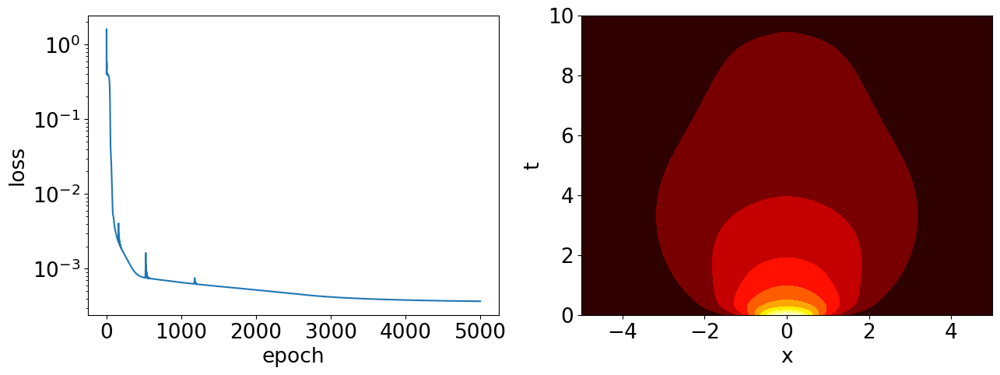

In [ ]:
pde      = PDE()
pde_loss = PDELoss(pde)
loss_hist = []

x, t = generate_2Dgrid((0, 5), (0, 10), (100, 200))
#x, t = generate_2Dgrid((-5, 5), (0, 10), (60, 60))
optimizer = optim.Adam(pde.parameters(), lr=1e-2)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=(0.1)**(1/2000))

################## Training and Plotting ##################

%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (15, 5));
font = {'size'   : 19}
plt.rc('font', **font)

for it in range(5001):
    try:
        optimizer.zero_grad()

        loss = pde_loss(x, t)
        loss_hist.append(loss.cpu().detach().numpy())

        loss.backward()
        optimizer.step()
        scheduler.step()
        if  it % 100 == 0:
            x_plot, t_plot, u_plot = plot_form(x, t, pde(x, t))

            ax1.cla()
            ax1.set_xlabel('epoch')
            ax1.set_ylabel('loss')
            ax1.set_yscale('log')
            ax1.plot(loss_hist)

            ax2.cla()
            ax2.set_xlabel('x')
            ax2.set_ylabel('t')
            ax2.contourf(x_plot, t_plot,  u_plot, np.linspace(-0.01, 1.0, 10), cmap = 'hot')
            ax2.contourf(-x_plot, t_plot,  u_plot, np.linspace(-0.01, 1.0, 10), cmap = 'hot')

            display.display(plt.gcf())
            display.clear_output(wait=True)

    except KeyboardInterrupt:
        break

In [ ]:
fig, ax = plt.subplots(1,1, figsize = (8,  5))
plt.close()

def animate(i):
    tt = np.linspace(0, 10, 100)[min(i, 99)]
    x = torch.linspace(0, 5, 100)[:, None]
    t = torch.ones_like(x) * tt
    u = pde(x, t).flatten()

    ax.cla()
    ax.set_xlim(-5,5)
    ax.set_ylim(-0.1,1.1)
    ax.grid()
    ax.plot(+x.detach().numpy(), u.detach().numpy(), 'b')
    ax.plot(-x.detach().numpy(), u.detach().numpy(), 'b')
    ax.legend(['t='+"%.2f" % tt], fontsize='small')

    return fig

anim = animation.FuncAnimation(fig, animate, frames=100, interval=100)
HTML(anim.to_jshtml())

In [ ]:
# Ensure the model is in evaluation mode
pde.eval()

# Create tensors for x and t at the desired point (x=0, t=0)
# Note: x^2 is used as the input for x, so for x=0, x^2 is also 0.
x_point = torch.tensor([[1.0]], requires_grad=False)  # x squared
t_point = torch.tensor([[0.0]], requires_grad=False)

# Make a prediction using the trained model
with torch.no_grad():  # We do not need to compute gradients here
    u_prediction = pde(x_point, t_point)

# Print the predicted value
print(f"Predicted value of u at x=0 and t=0: {u_prediction.item()}")

Predicted value of u at x=0 and t=0: 0.3678794503211975


# Example 3: Wave Equation (Hyperbolic PDE)

For simplicity let us explore a simple case:

### Architecture:
- Input Layer(2, 50) -> GELU -> Hidden Layer (50,50) -> GELU -> Output (50, 1)

### Details:
 - **Symmetry with respect to $x=0$:** To simplify the training process we can restrict the domain to $0 < x \leq x_0 $ by making the system symmetric. This can be done by centering the initial conditions at $x=0$ and putting the domain boundaries at $x\pm x_0$. We also need to make a transformation $x\to x^2$ in the $x$ array to make sure the reflection properties are obeyed at $x=0$.
 - **Initial conditions:** $$u(0,x) =e^{-x^2}\tanh(\alpha(x_0-x)^2),$$ here the $\tanh$ factor is placed to make sure the function vanishes at the boundary ($\alpha$ can be adjusted accordingly).
 - **Boundary conditions:** Reflective boundary conditions $$u(x_0)=0.$$
 - **Strong-enforcement:** To further simplify the training process, let us impose this force these conditions directly by making a transformation: $$u(t,x) \to u(t,x) \tanh(t (x_0-x)^2)  + u(0,x),$$
 i.e., when $t=0$ and when $x=x_0$ the first term vanish and we should get only the second term (which vanishes at the borders).

In [ ]:
class PDE(nn.Module):
    def __init__(self):
        super(PDE, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(2, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 1),
        )

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean = 0, std = 0.05)
                nn.init.constant_(m.bias,  val = 0.0)

    def forward(self, x, t):
        xt           = torch.cat((x**2, t), 1)
        initial_data = torch.exp(-x**2) * torch.tanh( 2 * (5 - x)**2 )
        bdry         =  torch.tanh( 2 * (5 - x)**2 * t**2 )
        net_out = self.net(xt) * bdry + initial_data
        return net_out


class PDELoss(nn.Module):
    def __init__(self, pde):
        super(PDELoss, self).__init__()
        self.pde = pde

    def forward(self, x, t):
        u   = self.pde(x, t)
        u20 = gradients(u, x, 2)
        u02 = gradients(u, t, 2)

        base_loss = torch.mean( (  u02 - u20  )**2)
        loss = base_loss

        return loss

In [ ]:
def generate_2Dgrid(range1, range2, Ns, requires_grad = True):
    grid1 = np.linspace(range1[0], range1[1], Ns[0], dtype = np.float32)
    grid2 = np.linspace(range2[0], range2[1], Ns[1], dtype = np.float32)
    x0, y0 = np.meshgrid(grid1, grid2)
    x = torch.tensor(x0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad)
    y = torch.tensor(y0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad)
    return x, y
def plot_form(x, y, z):
    Nx  = x.unique().shape[0]
    Ny = y.unique().shape[0]
    return map(lambda t: t.reshape(Ny, Nx).cpu().detach().numpy(), (x, y, z))

### Initialization
Parameters:

 - $x_0 = 5,$ $t_{\rm max} = 10$, $N_x = 120$, $N_t = 120$, ${\rm LR}=10^{-2}$
    - Does not work, discontininuous at $x=0$.
 -  $x_0 = 5,$ $t_{\rm max} = 10$, $N_x = 120$, $N_t = 120$, ${\rm LR}=10^{-3}$

In [ ]:
pde      = PDE()
pde_loss = PDELoss(pde)
loss_hist = []

x, t = generate_2Dgrid((0, 5), (0, 10), (60, 60))
optimizer = optim.Adam(pde.parameters(), lr=1e-2)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=(0.1)**(1/2000))


### Training Loop

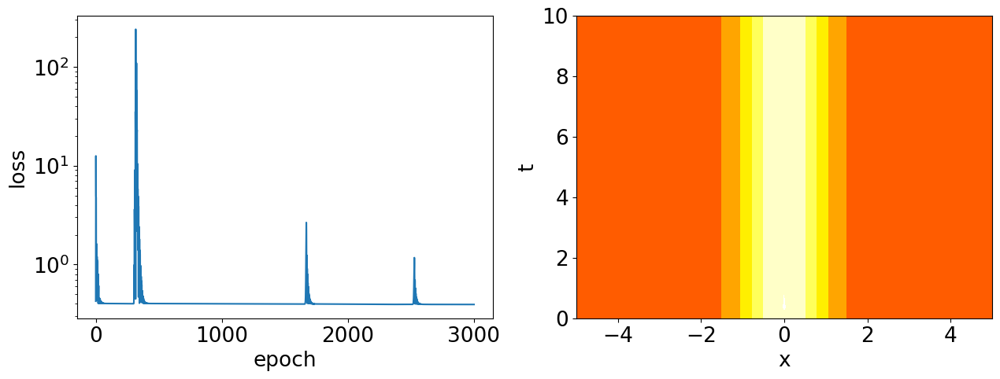

In [ ]:

################## Training and Plotting ##################
%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (15, 5));
font = {'size'   : 19}
plt.rc('font', **font)

for it in range(3001):
    try:
        optimizer.zero_grad()

        loss = pde_loss(x, t)
        loss_hist.append(loss.cpu().detach().numpy())

        loss.backward()
        optimizer.step()
        #scheduler.step()
        if  it % 100 == 0:
            x_plot, t_plot, u_plot = plot_form(x, t, pde(x, t))

            ax1.cla()
            ax1.set_xlabel('epoch')
            ax1.set_ylabel('loss')
            ax1.set_yscale('log')
            ax1.plot(loss_hist)

            ax2.cla()
            ax2.set_xlabel('x')
            ax2.set_ylabel('t')
            ax2.contourf(x_plot, t_plot, u_plot, np.linspace(-1.0, 1.0, 10), cmap = 'hot')
            ax2.contourf(-x_plot, t_plot,  u_plot, np.linspace(-1.01, 1.0, 10), cmap = 'hot')

            display.display(plt.gcf())
            display.clear_output(wait=True)

    except KeyboardInterrupt:
        break

In [ ]:
fig, ax = plt.subplots(1,1, figsize = (8,  5))
plt.close()

def animate(i):
    tt = np.linspace(0, 10, 100)[min(i, 99)]
    x = torch.linspace(0, 5, 100)[:, None]
    t = torch.ones_like(x) * tt
    u = pde(x, t).flatten()

    ax.cla()
    ax.set_xlim(-5,5)
    ax.set_ylim(-1.1,1.1)
    ax.grid()
    ax.plot(+x.detach().numpy(), u.detach().numpy(), 'b')
    ax.plot(-x.detach().numpy(), u.detach().numpy(), 'b')
    ax.legend(['t='+"%.2f" % tt], fontsize='small')

    return fig

anim = animation.FuncAnimation(fig, animate, frames=100, interval=100)
HTML(anim.to_jshtml())

# Example 3b: Wave Equation (Hyperbolic PDE)

For simplicity let us explore a simple case:

### Architecture:
- Input Layer(2, 50) -> GELU -> 5 Hidden Layer (50,50) -> GELU -> Output (50, 1)

### Details:
 - **Initial conditions:** $$u(0,x) =e^{-x^2}\tanh(\alpha(x_0-x)^2(x_0+x)^2),$$ here the $\tanh$ factor is placed to make sure the function vanishes at the boundary ($\alpha$ can be adjusted accordingly).
 - **Boundary conditions:** Reflective boundary conditions $$u(x_0)=0.$$
 - **Strong-enforcement:** To further simplify the training process, let us impose this force these conditions directly by making a transformation: $$u(t,x) \to u(t,x) \tanh(t (x_0-x)^2(x+x_0)^2)  + u(0,x),$$
 i.e., when $t=0$ and when $x=x_0$ the first term vanish and we should get only the second term (which vanishes at the borders).

In [ ]:
class PDE(nn.Module):
    def __init__(self):
        super(PDE, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(2, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 1),
        )

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean = 0, std = 0.05)
                nn.init.constant_(m.bias,  val = 0.0)

    def forward(self, x, t):
        xt           = torch.cat((x, t), 1)
        initial_data = torch.exp(-x**2) * torch.tanh( 2 * (5 - x)**2 * ( x+ 5)**2 )
        bdry         =  torch.tanh( 2 * (5 - x)**2 * (5 + x)**2 * t**2 )
        net_out = self.net(xt) * bdry + initial_data
        return net_out


class PDELoss(nn.Module):
    def __init__(self, pde):
        super(PDELoss, self).__init__()
        self.pde = pde

    def forward(self, x, t):
        u   = self.pde(x, t)
        u20 = gradients(u, x, 2)
        u02 = gradients(u, t, 2)

        base_loss = torch.mean( (  u02 - u20  )**2)
        loss = base_loss

        return loss

In [ ]:
def generate_2Dgrid(range1, range2, Ns, requires_grad = True):
    grid1 = np.linspace(range1[0], range1[1], Ns[0], dtype = np.float32)
    grid2 = np.linspace(range2[0], range2[1], Ns[1], dtype = np.float32)
    x0, y0 = np.meshgrid(grid1, grid2)
    x = torch.tensor(x0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad)
    y = torch.tensor(y0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad)
    return x, y
def plot_form(x, y, z):
    Nx  = x.unique().shape[0]
    Ny = y.unique().shape[0]
    return map(lambda t: t.reshape(Ny, Nx).cpu().detach().numpy(), (x, y, z))

### Initialization
Parameters:

 - $x_0 = 5,$ $t_{\rm max} = 10$, $N_x = 120$, $N_t = 120$, ${\rm LR}=10^{-2}$
    - Does not work, discontininuous at $x=0$.
 -  $x_0 = 5,$ $t_{\rm max} = 10$, $N_x = 120$, $N_t = 120$, ${\rm LR}=10^{-3}$

In [ ]:
pde      = PDE()
pde_loss = PDELoss(pde)
loss_hist = []

x, t = generate_2Dgrid((-5, 5), (0, 10), (400, 400))
optimizer = optim.Adam(pde.parameters(), lr=1e-2)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=(0.1)**(1/2000))


### Training Loop

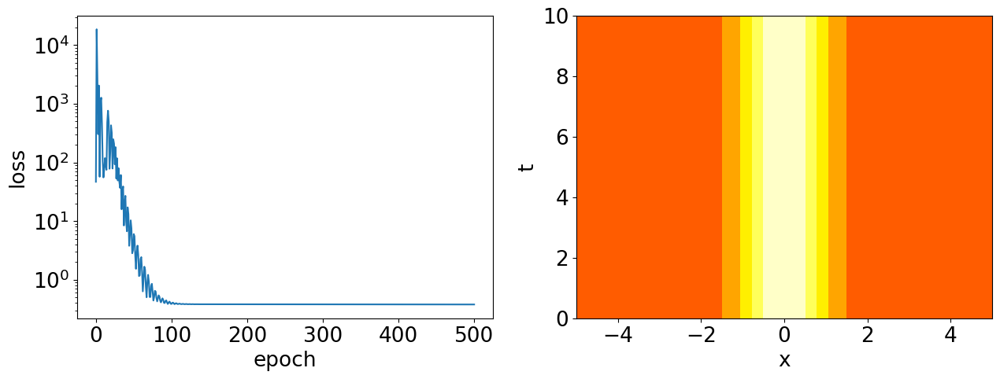

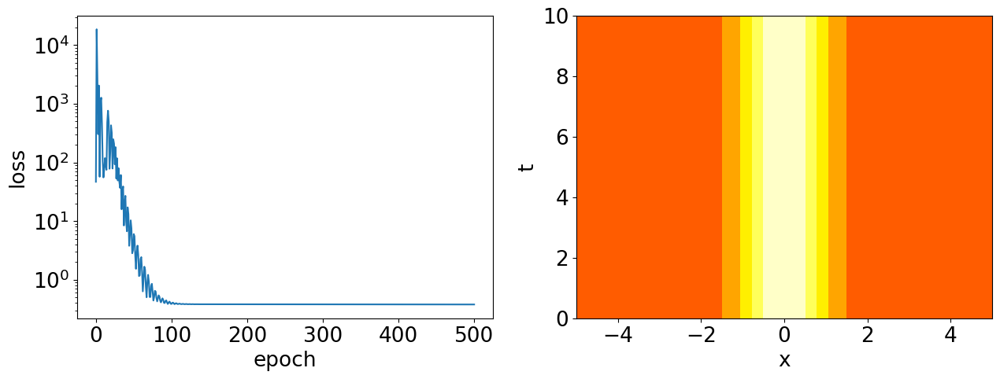

In [ ]:

################## Training and Plotting ##################
%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (15, 5));
font = {'size'   : 19}
plt.rc('font', **font)

for it in range(5001):
    try:
        optimizer.zero_grad()

        loss = pde_loss(x, t)
        loss_hist.append(loss.cpu().detach().numpy())

        loss.backward()
        optimizer.step()
        #scheduler.step()
        if  it % 100 == 0:
            x_plot, t_plot, u_plot = plot_form(x, t, pde(x, t))

            ax1.cla()
            ax1.set_xlabel('epoch')
            ax1.set_ylabel('loss')
            ax1.set_yscale('log')
            ax1.plot(loss_hist)

            ax2.cla()
            ax2.set_xlabel('x')
            ax2.set_ylabel('t')
            ax2.contourf(x_plot, t_plot, u_plot, np.linspace(-1.0, 1.0, 10), cmap = 'hot')
            #ax2.contourf(-x_plot, t_plot,  u_plot, np.linspace(-1.01, 1.0, 10), cmap = 'hot')

            display.display(plt.gcf())
            display.clear_output(wait=True)

    except KeyboardInterrupt:
        break

In [ ]:
fig, ax = plt.subplots(1,1, figsize = (8,  5))1
plt.close()

def animate(i):
    tt = np.linspace(0, 10, 100)[min(i, 99)]
    x = torch.linspace(0, 5, 100)[:, None]
    t = torch.ones_like(x) * tt
    u = pde(x, t).flatten()

    ax.cla()
    ax.set_xlim(-5,5)
    ax.set_ylim(-1.1,1.1)
    ax.grid()
    ax.plot(+x.detach().numpy(), u.detach().numpy(), 'b')
    ax.plot(-x.detach().numpy(), u.detach().numpy(), 'b')
    ax.legend(['t='+"%.2f" % tt], fontsize='small')

    return fig

anim = animation.FuncAnimation(fig, animate, frames=100, interval=100)
HTML(anim.to_jshtml())

# Example 3c: Wave Equation (Hyperbolic PDE)

For simplicity let us explore a classical case of wave propagation on a string:

### Architecture:
- Input Layer(2, 50) -> Tanh -> 1  Hidden Layer (50,50) -> Tanh -> Output (50, 1)

### Details:
 - **Initial conditions:** $$u(0,x) =e^{-x^2}\tanh(\alpha(x_0-x)^2(x_0+x)^2),$$ here the $\tanh$ factor is placed to make sure the function vanishes at the boundary ($\alpha$ can be adjusted accordingly).
 - **Boundary conditions:** Reflective boundary conditions $$u(x_0)=0.$$
 - **Weak-enforcement:** Let us try to impose boundary and initial conditions by fixing giving data at the boundaries of the domain, associate it with a loss and try to minimize that loss too.

In [ ]:
class PDE(nn.Module):
    def __init__(self):
        super(PDE, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(2, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 1),
        )

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean = 0, std = 0.05)
                nn.init.constant_(m.bias,  val = 0.0)

    def forward(self, x, t):
        xt           = torch.cat((x, t), 1)
        net_out = self.net(xt)
        return net_out


class PDELoss(nn.Module):
    def __init__(self, pde):
        super(PDELoss, self).__init__()
        self.pde = pde

# Loss for the PDE equation
    def wave_loss(self, x, t):
        u   = self.pde(x, t)
        u20 = gradients(u, x, 2)
        u02 = gradients(u, t, 2)
        base_loss = torch.mean( (  u02 - u20  )**2)

        return base_loss

    # Loss for the initial condition
    def ic_loss(self, x, t):
        u_pred   = self.pde(x, torch.zeros_like(t))
        u_true = torch.exp(-x**2)
        ic_loss_value = torch.mean((u_pred - u_true) ** 2)

        return ic_loss_value

   # Loss for the boundary condition

    def bdry_loss(self, x, t):
        u   = self.pde(x, t)
        x_left = -5 * torch.ones_like(t)
        x_right = 5 * torch.ones_like(t)

        # Evaluate the neural network's prediction at these boundary points
        u_left = self.pde(x_left, t)
        u_right = self.pde(x_right, t)

        bdry_loss_value = torch.mean(u_left ** 2) + torch.mean(u_right ** 2)

        return bdry_loss_value

  # Loss Total
    def forward(self, x, t):

        loss = self.wave_loss(x,t) + self.ic_loss(x,t) + 5*self.bdry_loss(x,t)

        return loss

In [ ]:
def generate_2Dgrid(range1, range2, Ns, requires_grad = True):
    grid1 = np.linspace(range1[0], range1[1], Ns[0], dtype = np.float32)
    grid2 = np.linspace(range2[0], range2[1], Ns[1], dtype = np.float32)
    x0, y0 = np.meshgrid(grid1, grid2)
    x = torch.tensor(x0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad)
    y = torch.tensor(y0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad)
    return x, y
def plot_form(x, y, z):
    Nx  = x.unique().shape[0]
    Ny = y.unique().shape[0]
    return map(lambda t: t.reshape(Ny, Nx).cpu().detach().numpy(), (x, y, z))

### Initialization
Parameters:

 - $x_0 = 5,$ $t_{\rm max} = 10$, $N_x = 120$, $N_t = 120$, ${\rm LR}=10^{-2}$
    - Does not work, discontininuous at $x=0$.
 -  $x_0 = 5,$ $t_{\rm max} = 10$, $N_x = 120$, $N_t = 120$, ${\rm LR}=10^{-3}$

In [ ]:
pde      = PDE()
pde_loss = PDELoss(pde)
loss_hist = []

x, t = generate_2Dgrid((-5, 5), (0, 10), (300, 300))
optimizer = optim.Adam(pde.parameters(), lr=1e-2)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=(0.1)**(1/2000))


### Training Loop

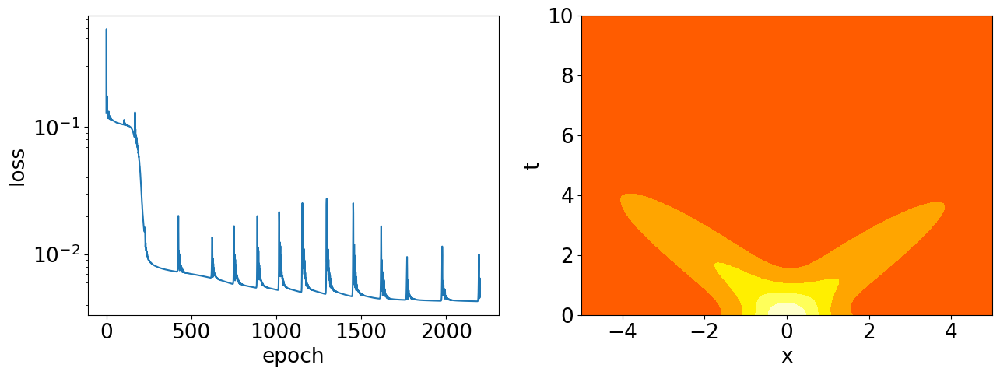

In [ ]:

################## Training and Plotting ##################
%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (15, 5));
font = {'size'   : 19}
plt.rc('font', **font)

for it in range(5001):
    try:
        optimizer.zero_grad()

        loss = pde_loss(x, t)
        loss_hist.append(loss.cpu().detach().numpy())

        loss.backward()
        optimizer.step()
        #scheduler.step()
        if  it % 100 == 0:
            x_plot, t_plot, u_plot = plot_form(x, t, pde(x, t))

            ax1.cla()
            ax1.set_xlabel('epoch')
            ax1.set_ylabel('loss')
            ax1.set_yscale('log')
            ax1.plot(loss_hist)

            ax2.cla()
            ax2.set_xlabel('x')
            ax2.set_ylabel('t')
            ax2.contourf(x_plot, t_plot, u_plot, np.linspace(-1.0, 1.0, 10), cmap = 'hot')
            #ax2.contourf(-x_plot, t_plot,  u_plot, np.linspace(-1.01, 1.0, 10), cmap = 'hot')

            display.display(plt.gcf())
            display.clear_output(wait=True)

    except KeyboardInterrupt:
        break

In [ ]:
fig, ax = plt.subplots(1,1, figsize = (8,  5))
plt.close()

def animate(i):
    tt = np.linspace(0, 10, 100)[min(i, 99)]
    x = torch.linspace(-5, 5, 100)[:, None]
    t = torch.ones_like(x) * tt
    u = pde(x, t).flatten()

    ax.cla()
    ax.set_xlim(-5,5)
    ax.set_ylim(-1.1,1.1)
    ax.grid()
    ax.plot(+x.detach().numpy(), u.detach().numpy(), 'b')
    #ax.plot(-x.detach().numpy(), u.detach().numpy(), 'b')
    ax.legend(['t='+"%.2f" % tt], fontsize='small')

    return fig

anim = animation.FuncAnimation(fig, animate, frames=100, interval=100)
HTML(anim.to_jshtml())

# Example 3d: Wave Equation (Hyperbolic PDE)

For simplicity let us explore a classical case of wave propagation on a string:

### Architecture:
- Input Layer(2, 50) -> Tanh -> 1  Hidden Layer (50,50) -> Tanh -> Output (50, 1)

### Details:
 - **Initial conditions:** $$u(0,x) =e^{-x^2}\tanh(\alpha(x_0-x)^2(x_0+x)^2),$$ here the $\tanh$ factor is placed to make sure the function vanishes at the boundary ($\alpha$ can be adjusted accordingly).
 - **Boundary conditions:** Reflective boundary conditions $$u_x(x_0)=0.$$
 - **Weak-enforcement:** Let us try to impose boundary and initial conditions by fixing giving data at the boundaries of the domain, associate it with a loss and try to minimize that loss too.

In [3]:
class PDE(nn.Module):
    def __init__(self):
        super(PDE, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(2, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 1),
        )

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean = 0, std = 0.05)
                nn.init.constant_(m.bias,  val = 0.0)

    def forward(self, x, t):
        xt           = torch.cat((x, t), 1)
        net_out = self.net(xt)
        return net_out


class PDELoss(nn.Module):
    def __init__(self, pde):
        super(PDELoss, self).__init__()
        self.pde = pde

# Loss for the PDE equation
    def wave_loss(self, x, t):
        u   = self.pde(x, t)
        u20 = gradients(u, x, 2)
        u02 = gradients(u, t, 2)
        base_loss = torch.mean( (  u02 - u20  )**2)

        return base_loss

    # Loss for the initial condition
    def ic_loss(self, x, t):
        u_pred   = self.pde(x, torch.zeros_like(t))
        u_true = torch.exp(-x**2)
        ic_loss_value = torch.mean((u_pred - u_true) ** 2)

        return ic_loss_value

   # Loss for the boundary condition

    def bdry_loss(self, x, t):
        u   = self.pde(x, t)
        u_x = gradients(u, x)

        x_left = -5 * torch.ones_like(t)
        x_right = 5 * torch.ones_like(t)
        # Requires setting requires_grad=True for x to compute gradients
        x_left.requires_grad_(True)
        x_right.requires_grad_(True)

        # Evaluate the neural network's prediction at these boundary points
        u_left = self.pde(x_left, t)
        u_right = self.pde(x_right, t)

        # Compute the gradients of u with respect to x at x = -5 and x = 5
        u_x_left = torch.autograd.grad(u_left, x_left, grad_outputs=torch.ones_like(u_left), create_graph=True)[0]
        u_x_right = torch.autograd.grad(u_right, x_right, grad_outputs=torch.ones_like(u_right), create_graph=True)[0]


        bdry_loss_value = torch.mean(u_x_left ** 2) + torch.mean(u_x_right ** 2)

        return bdry_loss_value

  # Loss Total
    def forward(self, x, t):

        loss = self.wave_loss(x,t) + self.ic_loss(x,t) + 5*self.bdry_loss(x,t)

        return loss

In [4]:
def generate_2Dgrid(range1, range2, Ns, requires_grad = True):
    grid1 = np.linspace(range1[0], range1[1], Ns[0], dtype = np.float32)
    grid2 = np.linspace(range2[0], range2[1], Ns[1], dtype = np.float32)
    x0, y0 = np.meshgrid(grid1, grid2)
    x = torch.tensor(x0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad, device = device)
    y = torch.tensor(y0.reshape(Ns[0]*Ns[1], 1), requires_grad = requires_grad, device = device)
    return x, y
def plot_form(x, y, z):
    Nx  = x.unique().shape[0]
    Ny = y.unique().shape[0]
    return map(lambda t: t.reshape(Ny, Nx).cpu().detach().numpy(), (x, y, z))

### Initialization
Parameters:

 - $x_0 = 5,$ $t_{\rm max} = 10$, $N_x = 120$, $N_t = 120$, ${\rm LR}=10^{-2}$
    - Does not work, discontininuous at $x=0$.
 -  $x_0 = 5,$ $t_{\rm max} = 10$, $N_x = 120$, $N_t = 120$, ${\rm LR}=10^{-3}$

In [7]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
pde      = PDE().to(device)
pde_loss = PDELoss(pde).to(device)
loss_hist = []

x, t = generate_2Dgrid((-5, 5), (0, 10), (500, 500))
optimizer = optim.Adam(pde.parameters(), lr=1e-2)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=(0.1)**(1/2000))


### Training Loop

OutOfMemoryError: CUDA out of memory. Tried to allocate 192.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 119.06 MiB is free. Process 7227 has 14.63 GiB memory in use. Of the allocated memory 14.23 GiB is allocated by PyTorch, and 271.02 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

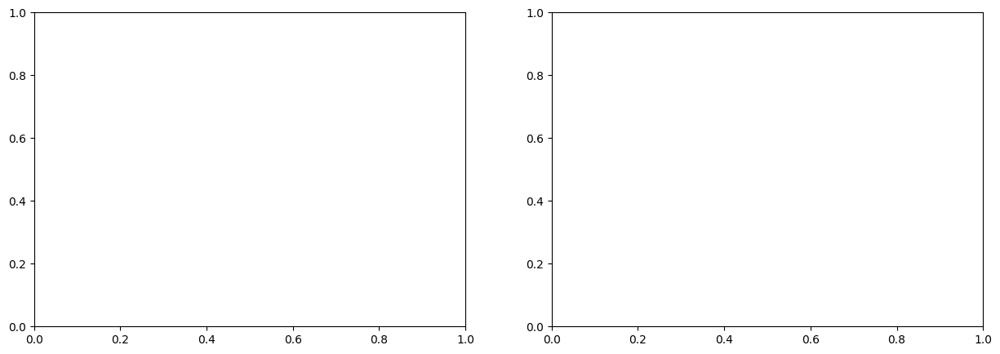

In [6]:

################## Training and Plotting ##################
%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (15, 5));
font = {'size'   : 19}
plt.rc('font', **font)

for it in range(10001):
    try:
        optimizer.zero_grad()

        loss = pde_loss(x, t)
        loss_hist.append(loss.cpu().detach().numpy())

        loss.backward()
        optimizer.step()
        #scheduler.step()
        if  it % 100 == 0:
            x_plot, t_plot, u_plot = plot_form(x, t, pde(x, t))

            ax1.cla()
            ax1.set_xlabel('epoch')
            ax1.set_ylabel('loss')
            ax1.set_yscale('log')
            ax1.plot(loss_hist)

            ax2.cla()
            ax2.set_xlabel('x')
            ax2.set_ylabel('t')
            ax2.contourf(x_plot, t_plot, u_plot, np.linspace(-1.0, 1.0, 10), cmap = 'hot')
            #ax2.contourf(-x_plot, t_plot,  u_plot, np.linspace(-1.01, 1.0, 10), cmap = 'hot')

            display.display(plt.gcf())
            display.clear_output(wait=True)

    except KeyboardInterrupt:
        break

In [11]:
fig, ax = plt.subplots(1,1, figsize = (8,  5))
plt.close()

def animate(i):
    tt = np.linspace(0, 10, 100)[min(i, 99)]
    x = torch.linspace(-5, 5, 100)[:, None].to(device)
    t = torch.ones_like(x) * tt
    u = pde(x, t).flatten().to(device)

    ax.cla()
    ax.set_xlim(-5,5)
    ax.set_ylim(-1.1,1.1)
    ax.grid()
    ax.plot(x.detach().cpu().numpy(), u.detach().cpu().numpy(), 'b')
    #ax.plot(-x.detach().numpy(), u.detach().numpy(), 'b')
    ax.legend(['t='+"%.2f" % tt], fontsize='small')

    return fig

anim = animation.FuncAnimation(fig, animate, frames=100, interval=100)
HTML(anim.to_jshtml())

# Example 4: Poisson Equation (Elliptic PDE)

In [ ]:
torch.zeros(1,1)


tensor([[0.]])